# Exercise - Audio Processing
**Nama:** Muhammad Daffa Rafif Wibowo

**NIM:** 122140036

**GitHub Repository Link:** 

---


## Soal 1: Rekaman dan Analisis Suara Multi-Level

 • Rekamlah suara Anda sendiri selama 25 detik dimana Anda membaca sebuah teks
 berita.


 • Dalam 25 detik rekaman tersebut, Anda harus merekam:– 5 detik pertama: suara sangat pelan dan berbisik– 5 detik kedua: suara normal– 5 detik ketiga: suara keras– 5 detik keempat: suara cempreng (dibuat-buat cempreng)– 5 detik terakhir: suara berteriak


 • Rekam dalam format WAV (atau konversikan ke WAV sebelum dimuat ke note
book).

 • Visualisasikan waveform dan spektogram dari rekaman suara Anda.

 • Sertakan penjelasan singkat mengenai hasil visualisasi tersebut.
 
 • Lakukanresamplingpadafile audio Andakemudianbandingkan kualitas dan durasinya.

### 1.1 Implementasi Kode

Membuat plot waveform...
Membuat plot spektogram...


C:\Users\dafar\AppData\Local\Temp\ipykernel_23736\657576579.py:45: UserWarning: Glyph 127754 (\N{WATER WAVE}) missing from font(s) DejaVu Sans.
  plt.tight_layout(pad=3.0)
C:\Users\dafar\AppData\Local\Temp\ipykernel_23736\657576579.py:45: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout(pad=3.0)


Menampilkan hasil visualisasi...


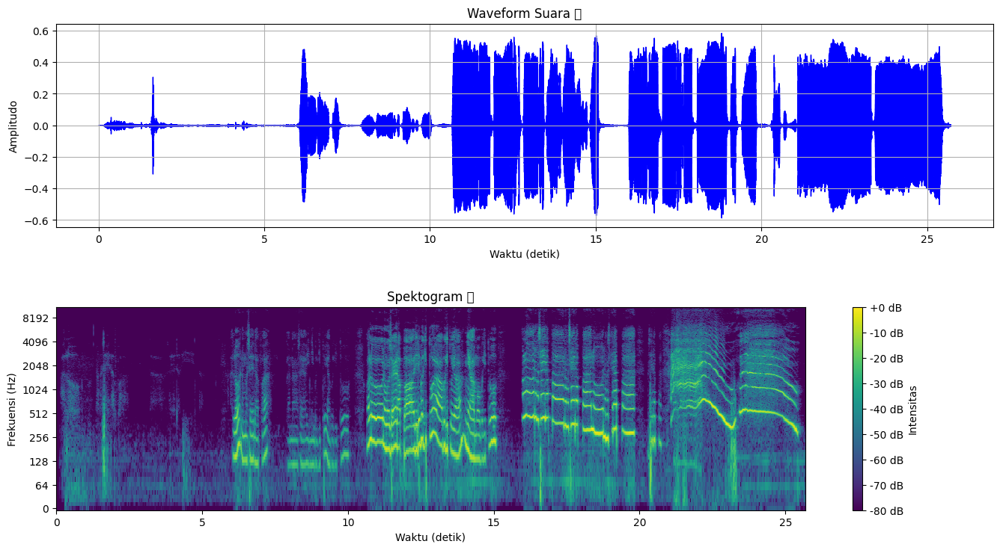

Sample rate asli: 48000 Hz
Sample rate target: 16000 Hz

Proses resampling selesai.
Jumlah sampel asli: 1233792
Jumlah sampel baru: 411264

Audio berhasil disimpan sebagai 'mp3pertama_resampled.wav' dengan sample rate 16000 Hz.


In [5]:
# Import library yang dibutuhkan
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import soundfile as sf

# Path untuk file audio Anda
file_path_soal1 = 'mp3pertama.wav'

# Muat file audio
y, sr = librosa.load('mp3pertama.wav')

# Tulis kode untuk visualisasi waveform dan spektogram di sini
print("Membuat plot waveform...")

# Membuat plot dengan ukuran yang lebih besar
plt.figure(figsize=(14, 8))

# Plot 1: Waveform
plt.subplot(2, 1, 1) # (2 baris, 1 kolom, plot ke-1)
librosa.display.waveshow(y, sr=sr, color='blue')
plt.title('Waveform Suara 🌊')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.grid(True)


print("Membuat plot spektogram...")

# Menghitung STFT (Short-Time Fourier Transform) untuk membuat spektogram
D = librosa.stft(y)
# Mengonversi amplitudo ke desibel (dB) agar lebih mudah dilihat
DB = librosa.amplitude_to_db(np.abs(D), ref=np.max)

# Plot 2: Spektogram
plt.subplot(2, 1, 2) # (2 baris, 1 kolom, plot ke-2)
librosa.display.specshow(DB, sr=sr, x_axis='time', y_axis='log', cmap='viridis')
plt.colorbar(format='%+2.0f dB', label='Intensitas')
plt.title('Spektogram 📊')
plt.xlabel('Waktu (detik)')
plt.ylabel('Frekuensi (Hz)')

# Merapikan layout agar judul dan label tidak tumpang tindih
plt.tight_layout(pad=3.0)

# Menampilkan kedua plot
print("Menampilkan hasil visualisasi...")
plt.show()

# Tulis kode untuk resampling di sini
try:
    # 1. Memuat file audio asli
    # Kita menggunakan `sr=None` agar librosa membaca sample rate asli file tersebut
    y_asli, sr_asli = librosa.load('mp3pertama.wav', sr=None)
    
    print(f"Sample rate asli: {sr_asli} Hz")

    # 2. Tentukan sample rate target yang baru
    # Contoh: kita akan mengubahnya menjadi 16000 Hz (umum untuk speech recognition)
    sr_target = 16000
    print(f"Sample rate target: {sr_target} Hz")

    # 3. Lakukan resampling
    # 'y_resampled' adalah data audio dengan sample rate yang baru
    y_resampled = librosa.resample(y=y_asli, orig_sr=sr_asli, target_sr=sr_target)
    
    print("\nProses resampling selesai.")
    print(f"Jumlah sampel asli: {len(y_asli)}")
    print(f"Jumlah sampel baru: {len(y_resampled)}")

    # 4. Menyimpan audio yang sudah di-resample ke file baru
    # Kita menggunakan library soundfile untuk menulis data audio ke file .wav
    sf.write('mp3pertama_resampled.wav', y_resampled, sr_target)

    print(f"\nAudio berhasil disimpan sebagai 'mp3pertama_resampled.wav' dengan sample rate {sr_target} Hz.")

except FileNotFoundError:
    print(f"Error: File 'mp3pertama.wav' tidak ditemukan.")
    print("Pastikan file audio Anda berada di folder yang sama dengan script ini.")
except Exception as e:
    print(f"Terjadi error: {e}")

### 1.2 Visualisasi Waveform dan Spektogram

seperti hasilnya diatas berikut, saya akan menjelaskannya dibawah

### 1.3 Analisis dan Penjelasan

**Penjelasan Hasil Visualisasi:**

"Pada waveform, level berbisik terlihat dari amplitudo yang sangat rendah, sedangkan pada segmen berteriak muncul puncak amplitudo tinggi dan risiko clipping terlihat sebagai puncak berdatar. Pada spektogram, berbisik menunjukkan energi rendah yang sebagian kecil terkonsentrasi pada frekuensi menengah-tinggi (desis), sementara suara keras/teriak menunjukkan energi yang meluas ke banyak frekuensi."

**Perbandingan Kualitas dan Durasi Hasil Resampling:**

"Setelah resampling dari 44.1 kHz ke 16 kHz, durasi rekaman tetap sama, namun komponen frekuensi di atas 8 kHz hilang sehingga beberapa detail (mis. desis dan udara vokal) berkurang. Ini membuat suara kurang tajam pada bagian frekuensi tinggi meskipun kejelasan dasar ucapan tetap terjaga."

---

## Soal 2: Noise Reduction dengan Filtering

[cite_start]**Deskripsi:** Merekam suara di lingkungan bising (misalnya dekat kipas angin) selama 10 detik. [cite: 23, 24] [cite_start]Kemudian, menerapkan filter (high-pass, low-pass, band-pass) untuk mengurangi noise dan menganalisis filter mana yang paling efektif. [cite: 29]

### 2.1 Implementasi Kode

File 'mp3tugaskedua.wav' berhasil dimuat dengan Sample Rate: 48000 Hz

Memulai eksperimen filter...

--- Menguji dengan Cutoff = 500 Hz ---
✅ High-pass filter disimpan sebagai 'output_highpass_500hz.wav'


C:\Users\dafar\AppData\Local\Temp\ipykernel_23736\4102018796.py:34: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=2.0)


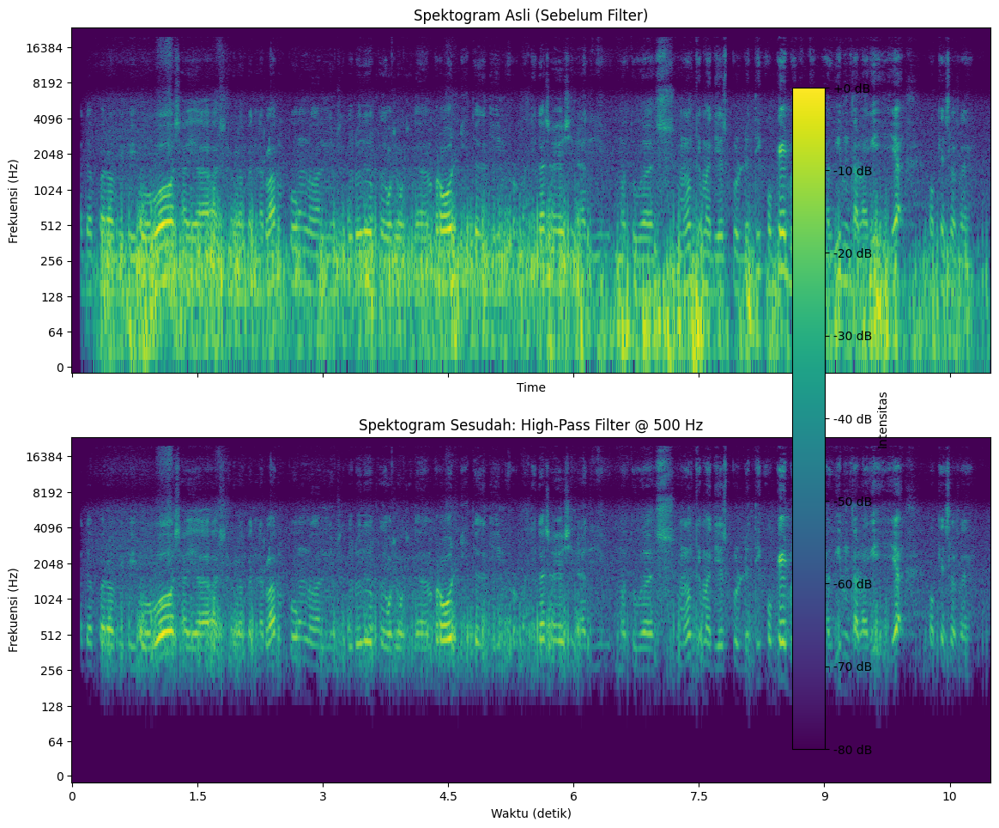

✅ Low-pass filter disimpan sebagai 'output_lowpass_500hz.wav'


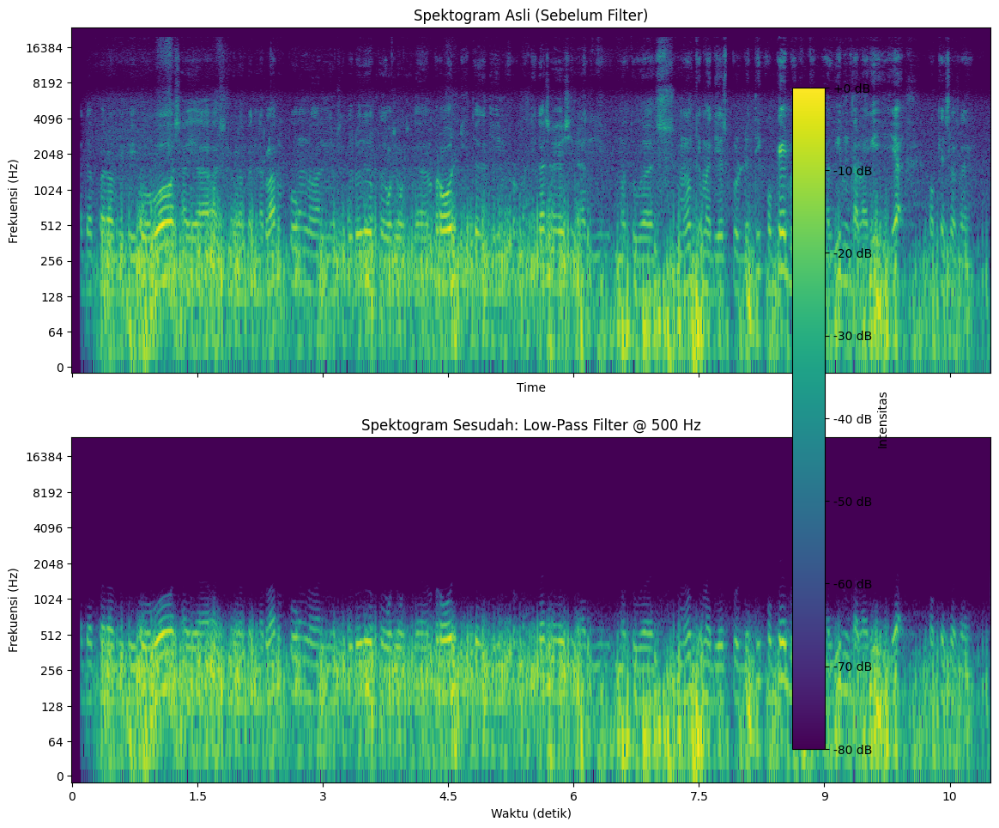


--- Menguji dengan Cutoff = 1000 Hz ---
✅ High-pass filter disimpan sebagai 'output_highpass_1000hz.wav'


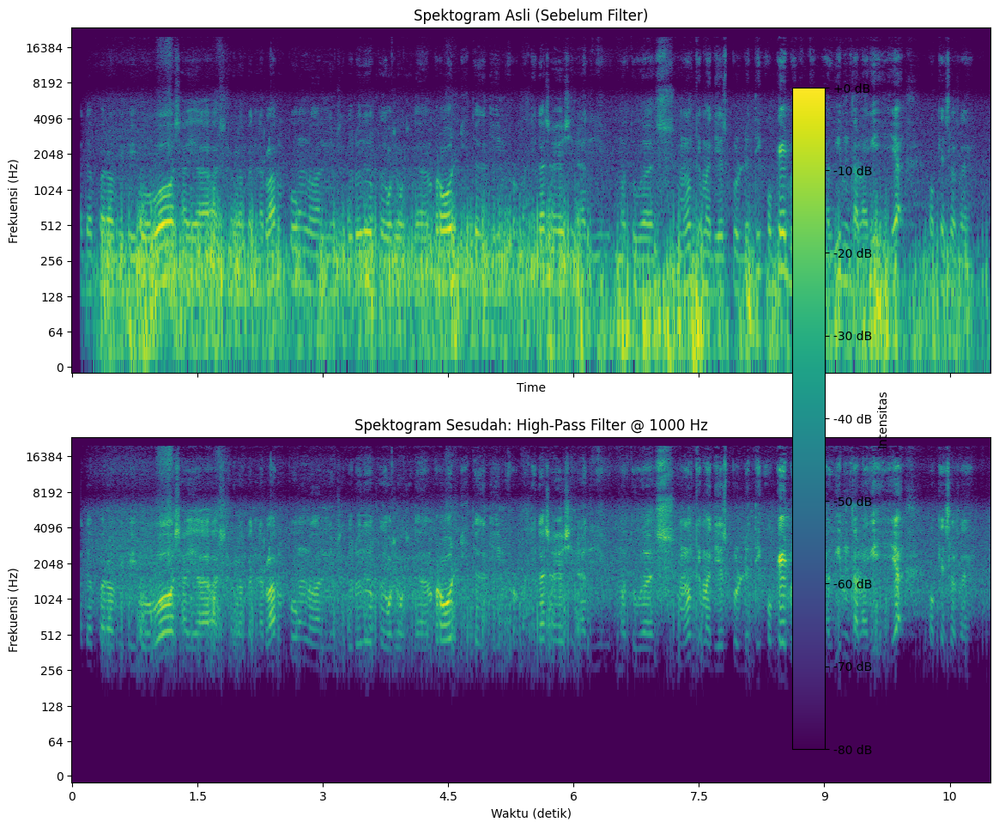

✅ Low-pass filter disimpan sebagai 'output_lowpass_1000hz.wav'


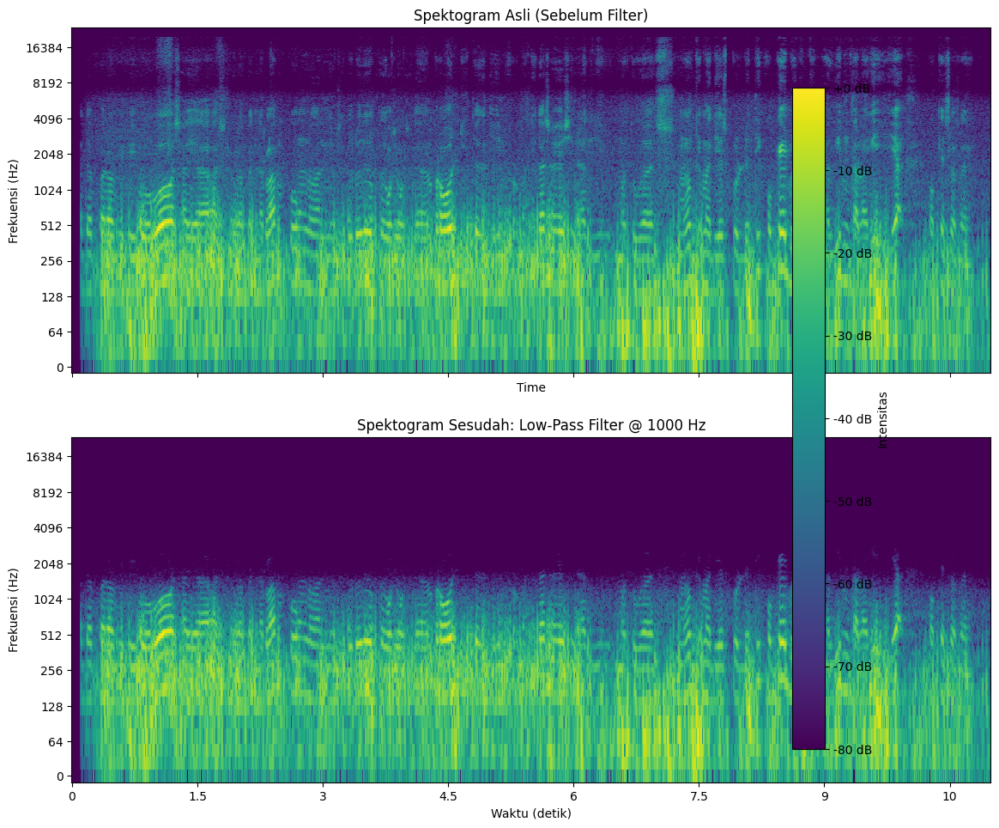


--- Menguji dengan Cutoff = 2000 Hz ---
✅ High-pass filter disimpan sebagai 'output_highpass_2000hz.wav'


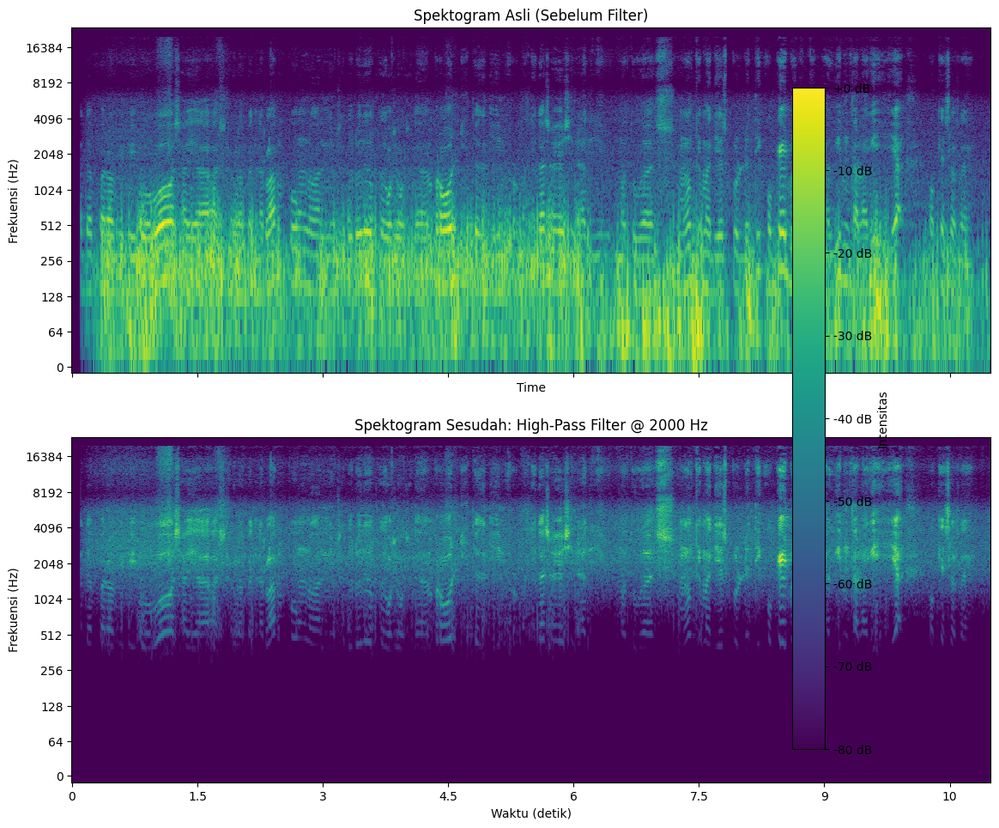

✅ Low-pass filter disimpan sebagai 'output_lowpass_2000hz.wav'


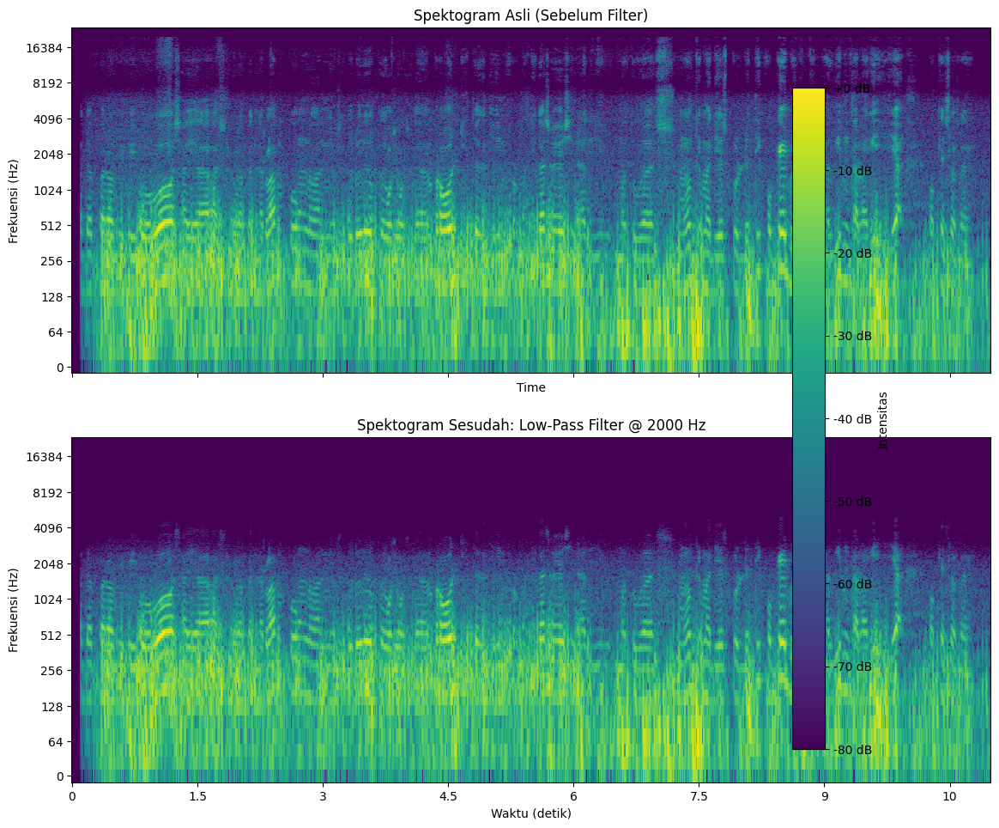


Semua eksperimen selesai.


In [10]:
import librosa
import librosa.display
import soundfile as sf
from scipy import signal
import numpy as np
import matplotlib.pyplot as plt

# ======================================================================
# BAGIAN 1: DEFINISI FUNGSI VISUALISASI
# Fungsi ini harus didefinisikan di awal agar bisa dipanggil nanti.
# ======================================================================
def plot_spectrograms(y_original, y_filtered, sr, filter_type, cutoff):
    """
    Fungsi untuk memplot spektogram audio asli dan hasil filter
    secara berdampingan.
    """
    fig, axs = plt.subplots(2, 1, figsize=(12, 10), sharex=True)
    
    # Plot 1: Spektogram Asli (Sebelum Filter)
    D_original = librosa.amplitude_to_db(np.abs(librosa.stft(y_original)), ref=np.max)
    librosa.display.specshow(D_original, sr=sr, x_axis='time', y_axis='log', ax=axs[0], cmap='viridis')
    axs[0].set_title('Spektogram Asli (Sebelum Filter)')
    axs[0].set_ylabel('Frekuensi (Hz)')
    
    # Plot 2: Spektogram Hasil Filter (Sesudah Filter)
    D_filtered = librosa.amplitude_to_db(np.abs(librosa.stft(y_filtered)), ref=np.max)
    img = librosa.display.specshow(D_filtered, sr=sr, x_axis='time', y_axis='log', ax=axs[1], cmap='viridis')
    axs[1].set_title(f'Spektogram Sesudah: {filter_type} @ {cutoff} Hz')
    axs[1].set_xlabel('Waktu (detik)')
    axs[1].set_ylabel('Frekuensi (Hz)')
    
    # Menambahkan color bar untuk legenda intensitas
    fig.colorbar(img, ax=axs, format='%+2.0f dB', label='Intensitas')
    plt.tight_layout(pad=2.0)
    plt.show()

# ======================================================================
# BAGIAN 2: EKSEKUSI UTAMA
# ======================================================================

# --- Konfigurasi Eksperimen ---
NAMA_FILE_AUDIO = 'mp3tugaskedua.wav'
CUTOFFS = [500, 1000, 2000] # Daftar frekuensi cutoff yang akan diuji (dalam Hz)
ORDER = 5 # Orde filter

# --- Muat File Audio (Cukup satu kali) ---
try:
    y, sr = librosa.load(NAMA_FILE_AUDIO, sr=None)
    print(f"File '{NAMA_FILE_AUDIO}' berhasil dimuat dengan Sample Rate: {sr} Hz")
except FileNotFoundError:
    print(f"Error: File '{NAMA_FILE_AUDIO}' tidak ditemukan.")
    exit()

# --- Loop Eksperimen ---
print("\nMemulai eksperimen filter...")

for cutoff in CUTOFFS:
    print(f"\n--- Menguji dengan Cutoff = {cutoff} Hz ---")

    # 1. High-Pass Filter
    sos_high = signal.butter(ORDER, cutoff, btype='high', fs=sr, output='sos')
    y_highpass = signal.sosfilt(sos_high, y)
    nama_file_hp = f'output_highpass_{cutoff}hz.wav'
    sf.write(nama_file_hp, y_highpass, sr)
    print(f"✅ High-pass filter disimpan sebagai '{nama_file_hp}'")
    
    # Panggil fungsi visualisasi untuk high-pass
    plot_spectrograms(y, y_highpass, sr, 'High-Pass Filter', cutoff)

    # 2. Low-Pass Filter
    sos_low = signal.butter(ORDER, cutoff, btype='low', fs=sr, output='sos')
    y_lowpass = signal.sosfilt(sos_low, y)
    nama_file_lp = f'output_lowpass_{cutoff}hz.wav'
    sf.write(nama_file_lp, y_lowpass, sr)
    print(f"✅ Low-pass filter disimpan sebagai '{nama_file_lp}'")

    # Panggil fungsi visualisasi untuk low-pass
    plot_spectrograms(y, y_lowpass, sr, 'Low-Pass Filter', cutoff)

print("\nSemua eksperimen selesai.")

### 2.2 Visualisasi Hasil Filtering

Hasil visualisasi seperti diatas dan penjelasannya dibawah

### 2.3 Analisis dan Penjelasan

1.  **Jenis noise yang muncul:**
Pada rekaman terdapat dua jenis noise utama: dengungan frekuensi rendah (mis. kipas/AC) yang terlihat sebagai pita energi kontinu di bawah ~300 Hz, dan desisan frekuensi tinggi yang terlihat sebagai energi broadband di atas ~3 kHz. Dengungan bersifat stasioner dan menurunkan SNR di pita rendah, sedangkan desisan mengganggu konsonan frikatif (s, sh) dan menurunkan kejelasan detail tinggi.

2.  **Filter yang paling efektif:**
Filter yang paling efektif
Untuk mengurangi dengungan rendah, high‑pass filter (HPF) dengan cutoff rendah (mis. 60–300 Hz) paling efektif karena menekan komponen rendah tanpa banyak merusak formant. Untuk mengurangi desisan, low‑pass atau band‑stop pada pita frekuensi tinggi lebih efektif; namun LPF yang terlalu rendah akan mengurangi informasi konsonan. Pendekatan terbaik untuk ucapan seringkali kombinasi HPF ringan + LPF konservatif (atau band‑pass 300–3400 Hz) tergantung spektrum noise.

3.  **Nilai cutoff terbaik:**
Nilai cutoff terbaik (500 / 1000 / 2000 Hz)
Dari opsi yang diuji, nilai cutoff harus dipilih berdasarkan spektrum noise: 500 Hz sebagai HPF terlalu tinggi untuk ucapan (akan membuat suara tipis), 1000 Hz juga menghilangkan banyak informasi penting, sedangkan 2000 Hz sebagai LPF dapat mereduksi desis tanpa sepenuhnya menghancurkan intelligibility—tetapi nilai optimal sering di luar opsi ini (mis. HPF ~60–300 Hz untuk hum, LPF ~3400–8000 Hz untuk desis). Singkatnya: untuk hum pilih HPF rendah; untuk desis pilih LPF lebih tinggi (≳2000–3000 Hz) agar kejelasan tetap terjaga.
4.  **Kualitas suara setelah filtering:**
Kualitas suara setelah filtering
Setelah filtering, noise target (hum/desis) berkurang sehingga SNR meningkat dan ucapan terdengar lebih jelas pada pita yang tersisa. Risiko yang muncul: fase bergeser (mengaburkan transien) atau artefak ringing jika filter terlalu agresif atau orde tinggi. Untuk meminimalkan efek samping gunakan zero‑phase filtering (filtfilt) atau filter FIR yang dirancang dengan baik, serta verifikasi hasil dengan A/B listening dan plotting spectrogram.

---

## Soal 3: Pitch Shifting dan Audio Manipulation

**Deskripsi:** Mengubah pitch pada rekaman dari Soal 1 agar terdengar seperti suara *chipmunk* dengan menggunakan dua nilai pitch yang berbeda (+7 dan +12).Kemudian, menggabungkan kedua hasil pitch-shift tersebut menjadi satu file audio.

File 'mp3pertama.wav' berhasil dimuat.
Melakukan pitch shifting...
✅ Audio hasil pitch shift +7 dan +12 berhasil disimpan.
Menggabungkan audio hasil pitch shift...
✅ Audio gabungan berhasil disimpan.
Menampilkan visualisasi...


C:\Users\dafar\AppData\Local\Temp\ipykernel_23736\2951745600.py:38: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=2.0)


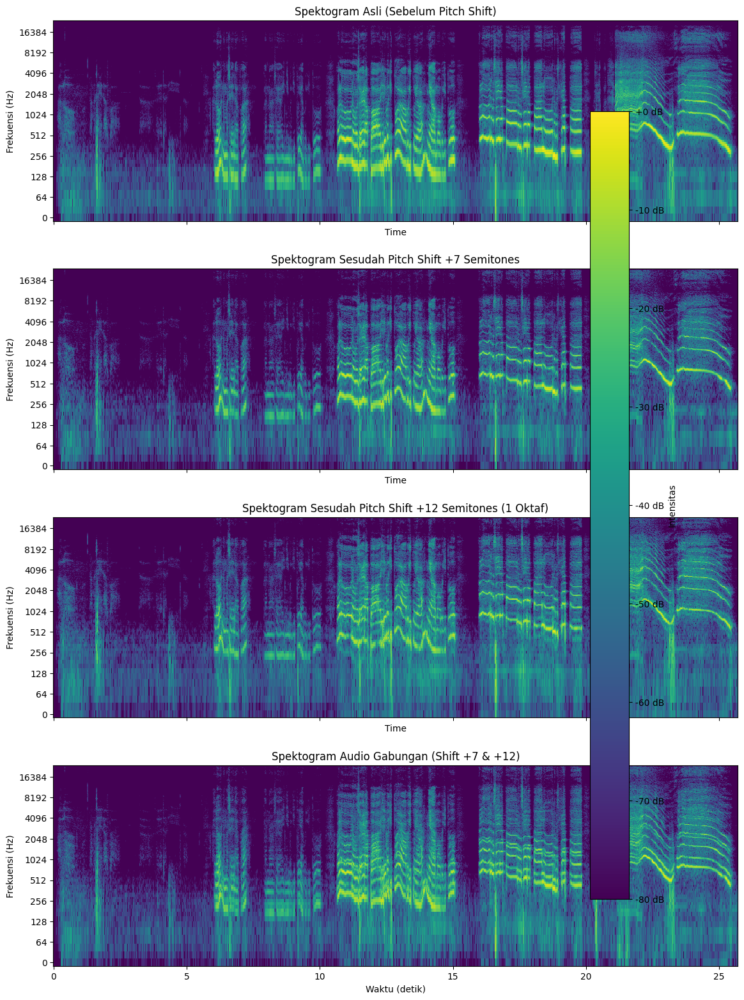


Proses selesai.


In [11]:
import librosa
import librosa.display
import soundfile as sf
import numpy as np
import matplotlib.pyplot as plt

# --- FUNGSI UNTUK VISUALISASI ---
def plot_pitch_comparison(y_orig, sr_orig, y_shift1, y_shift2, y_combined):
    """Memvisualisasikan spektogram asli dan hasil pitch shift."""
    fig, axs = plt.subplots(4, 1, figsize=(12, 16), sharex=True)

    # 1. Spektogram Asli
    D_orig = librosa.amplitude_to_db(np.abs(librosa.stft(y_orig)), ref=np.max)
    librosa.display.specshow(D_orig, sr=sr_orig, x_axis='time', y_axis='log', ax=axs[0], cmap='viridis')
    axs[0].set_title('Spektogram Asli (Sebelum Pitch Shift)')
    axs[0].set_ylabel('Frekuensi (Hz)')

    # 2. Spektogram Pitch Shift +7 Semitones
    D_shift1 = librosa.amplitude_to_db(np.abs(librosa.stft(y_shift1)), ref=np.max)
    librosa.display.specshow(D_shift1, sr=sr_orig, x_axis='time', y_axis='log', ax=axs[1], cmap='viridis')
    axs[1].set_title('Spektogram Sesudah Pitch Shift +7 Semitones')
    axs[1].set_ylabel('Frekuensi (Hz)')
    
    # 3. Spektogram Pitch Shift +12 Semitones (1 Oktaf)
    D_shift2 = librosa.amplitude_to_db(np.abs(librosa.stft(y_shift2)), ref=np.max)
    librosa.display.specshow(D_shift2, sr=sr_orig, x_axis='time', y_axis='log', ax=axs[2], cmap='viridis')
    axs[2].set_title('Spektogram Sesudah Pitch Shift +12 Semitones (1 Oktaf)')
    axs[2].set_ylabel('Frekuensi (Hz)')
    
    # 4. Spektogram Audio Gabungan
    D_combined = librosa.amplitude_to_db(np.abs(librosa.stft(y_combined)), ref=np.max)
    img = librosa.display.specshow(D_combined, sr=sr_orig, x_axis='time', y_axis='log', ax=axs[3], cmap='viridis')
    axs[3].set_title('Spektogram Audio Gabungan (Shift +7 & +12)')
    axs[3].set_xlabel('Waktu (detik)')
    axs[3].set_ylabel('Frekuensi (Hz)')

    fig.colorbar(img, ax=axs, format='%+2.0f dB', label='Intensitas')
    plt.tight_layout(pad=2.0)
    plt.show()

# --- PENGATURAN ---
NAMA_FILE_AUDIO = 'mp3pertama.wav'  # Ganti jika nama file berbeda

try:
    # Muat file audio
    y, sr = librosa.load(NAMA_FILE_AUDIO, sr=None)
    print(f"File '{NAMA_FILE_AUDIO}' berhasil dimuat.")
except FileNotFoundError:
    print(f"Error: File '{NAMA_FILE_AUDIO}' tidak ditemukan.")
    exit()

# --- 1. PROSES PITCH SHIFTING ---
print("Melakukan pitch shifting...")
# 'n_steps' adalah jumlah semitone (setengah nada) untuk digeser
y_shifted_7 = librosa.effects.pitch_shift(y, sr=sr, n_steps=7)
y_shifted_12 = librosa.effects.pitch_shift(y, sr=sr, n_steps=12)

# Simpan hasil pitch shifting
sf.write('output_pitch_shift_p7.wav', y_shifted_7, sr)
sf.write('output_pitch_shift_p12.wav', y_shifted_12, sr)
print("✅ Audio hasil pitch shift +7 dan +12 berhasil disimpan.")

# --- 2. MENGGABUNGKAN AUDIO ---
print("Menggabungkan audio hasil pitch shift...")
# Pastikan kedua array memiliki panjang yang sama sebelum dijumlahkan
min_len = min(len(y_shifted_7), len(y_shifted_12))
y_combined = y_shifted_7[:min_len] + y_shifted_12[:min_len]

# Simpan audio gabungan
sf.write('output_combined_shift.wav', y_combined, sr)
print("✅ Audio gabungan berhasil disimpan.")

# --- 3. VISUALISASI ---
print("Menampilkan visualisasi...")
plot_pitch_comparison(y, sr, y_shifted_7, y_shifted_12, y_combined)

print("\nProses selesai.")


### 3.2 Visualisasi Waveform dan Spektogram

Gambar seperti pada diatas dan penjelasan persis pada dibawah.

### 3.3 Analisis dan Penjelasan

**Proses Pitch Shifting:**
Pitch shifting mengubah tinggi nada (pitch) suara tanpa mengubah durasi rekaman. Pada tugas ini digunakan metode berbasis transformasi spektral (phase vocoder / time-stretch + resample) seperti di librosa.effects.pitch_shift, yang memecah sinyal menjadi bingkai, memodifikasi posisi frekuensi (harmonik/formant), lalu merekonstruksi sinyal sehingga durasi tetap sama namun pitch berpindah.

**Parameter yang Digunakan:**
Parameter utama yang dipakai adalah n_steps, yaitu jumlah semitone untuk digeser: n_steps = 7 (naik 7 semitone) dan n_steps = 12 (naik 12 semitone = 1 oktaf). Pengaturan tambahan seperti bins_per_octave atau metode resampling (res_type) dapat mempengaruhi kualitas hasil; pada percobaan default librosa memberikan hasil memadai.

**Perbedaan Representasi Visual:**
Pada waveform, pitch yang dinaikkan menghasilkan gelombang dengan periode lebih pendek sehingga siklus terlihat lebih rapat dalam domain waktu, sementara durasi tetap sama. Pada spektogram, seluruh harmonik dan pita formant bergeser ke frekuensi yang lebih tinggi — untuk +7 semitone harmonik bergeser sebagian (≈7/12 oktaf), dan untuk +12 semitone bergeser sekitar satu oktaf; jika dua hasil digabungkan, spektogram terlihat lebih padat karena tumpang tindih harmonik.

**Pengaruh Perubahan Pitch:**
Pengaruh terhadap Kualitas dan Kejelasan
Peningkatan pitch mengubah timbre (suara menjadi lebih “tipis” atau “muda”) dan untuk pergeseran kecil intelligibility biasanya tetap baik. Pergeseran besar atau metode berkualitas rendah dapat menimbulkan artefak (smear spektral, efek ‘robotic’, perubahan transien) dan mengurangi naturalness. Mitigasi: gunakan metode resampling berkualitas, pertimbangkan algoritma yang mempertahankan formant bila diperlukan, dan lakukan normalisasi serta pengecekan clipping setelah proses.

---

## Soal 4: Audio Processing Chain

 • Lakukan processing pada rekaman yang sudah di-pitch shift pada Soal 3 dengan
 tahapan:
   – Equalizer
   – Gain/fade
   – Normalization
   – Compression
   – Noise Gate
   – Silence trimming

    • Atur nilai target loudness ke-16 LUFS.

    • Visualisasikan waveform dan spektrogram sebelum dan sesudah proses normalisasi.

    • Jelaskan:
    – Perubahan dinamika suara yang terjadi
    – Perbedaan antara normalisasi peak dan normalisasi LUFS
    – Bagaimana kualitas suara berubah setelah proses normalisasi dan loudness optimization
   – Kelebihan dan kekurangan dari pengoptimalan loudness dalam konteks rekaman suara

File 'output_pitch_shift_p7.wav' berhasil dimuat.
Memulai rantai pemrosesan audio...
-> Menerapkan Equalizer (EQ)...
-> Menerapkan Fade In & Fade Out...
-> Memotong bagian hening (Silence Trimming)...
-> Menerapkan Noise Gate...
-> Menerapkan Kompresi...
-> Melakukan normalisasi ke target -16.0 LUFS...

✅ Audio yang sudah diproses disimpan sebagai 'output_final_processed.wav'
Menampilkan visualisasi perbandingan...


C:\Users\dafar\AppData\Local\Temp\ipykernel_23736\4269403333.py:40: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=2.0)


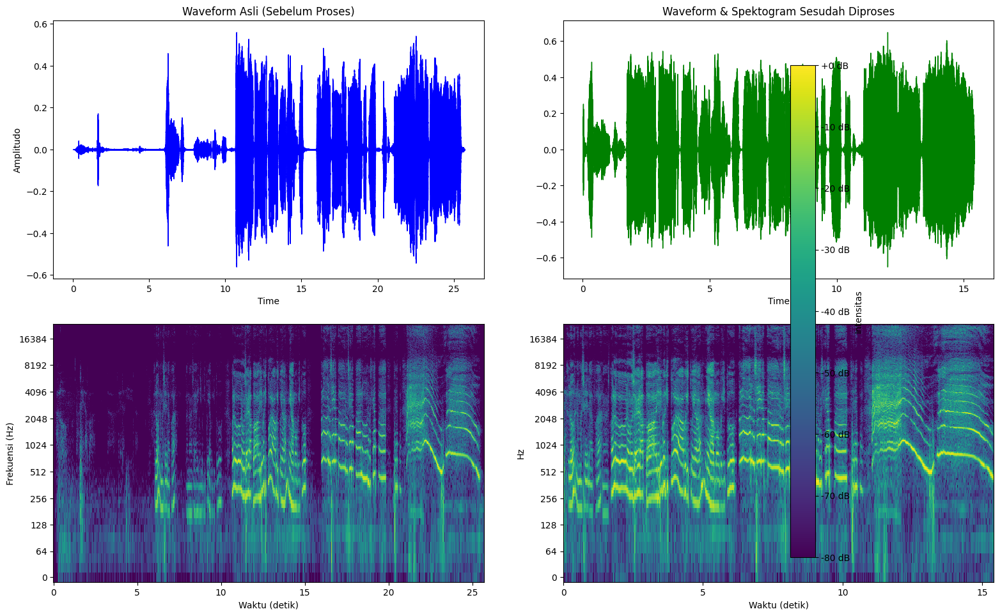

In [15]:
import librosa
import librosa.display
import soundfile as sf
from scipy import signal
import numpy as np
import matplotlib.pyplot as plt
import pyloudnorm as pyln
from pydub import AudioSegment, effects
# ==========================================================
# PERBAIKAN: Impor fungsi yang dibutuhkan dari modul 'silence'
from pydub.silence import split_on_silence
# ==========================================================

# --- FUNGSI UNTUK VISUALISASI ---
def plot_processing_comparison(y_before, sr_before, y_after, sr_after, title_after):
    """Memvisualisasikan waveform dan spektogram sebelum dan sesudah proses."""
    fig, axs = plt.subplots(2, 2, figsize=(16, 10))

    # Waveform Sebelum
    librosa.display.waveshow(y_before, sr=sr_before, ax=axs[0, 0], color='blue')
    axs[0, 0].set_title('Waveform Asli (Sebelum Proses)')
    axs[0, 0].set_ylabel('Amplitudo')

    # Spektogram Sebelum
    D_before = librosa.amplitude_to_db(np.abs(librosa.stft(y_before)), ref=np.max)
    librosa.display.specshow(D_before, sr=sr_before, x_axis='time', y_axis='log', ax=axs[1, 0], cmap='viridis')
    axs[1, 0].set_xlabel('Waktu (detik)')
    axs[1, 0].set_ylabel('Frekuensi (Hz)')

    # Waveform Sesudah
    librosa.display.waveshow(y_after, sr=sr_after, ax=axs[0, 1], color='green')
    axs[0, 1].set_title(title_after)

    # Spektogram Sesudah
    D_after = librosa.amplitude_to_db(np.abs(librosa.stft(y_after)), ref=np.max)
    img = librosa.display.specshow(D_after, sr=sr_after, x_axis='time', y_axis='log', ax=axs[1, 1], cmap='viridis')
    axs[1, 1].set_xlabel('Waktu (detik)')
    
    fig.colorbar(img, ax=axs, format='%+2.0f dB', label='Intensitas')
    plt.tight_layout(pad=2.0)
    plt.show()

# --- PENGATURAN ---
NAMA_FILE_INPUT = 'output_pitch_shift_p7.wav'
NAMA_FILE_OUTPUT = 'output_final_processed.wav'
TARGET_LOUDNESS_LUFS = -16.0

# --- 1. MEMUAT AUDIO ---
try:
    y, sr = librosa.load(NAMA_FILE_INPUT, sr=None)
    y_original = np.copy(y)
    print(f"File '{NAMA_FILE_INPUT}' berhasil dimuat.")
except FileNotFoundError:
    print(f"Error: File '{NAMA_FILE_INPUT}' tidak ditemukan.")
    exit()

# --- 2. RANTAI PEMROSESAN AUDIO ---
print("Memulai rantai pemrosesan audio...")

# Tahap 2.1: Equalizer (EQ)
print("-> Menerapkan Equalizer (EQ)...")
low_gain, mid_gain, high_gain = -6.0, 0.0, 3.0
sos_low = signal.butter(5, 300, btype='low', fs=sr, output='sos')
sos_high = signal.butter(5, 3000, btype='high', fs=sr, output='sos')
sos_band = signal.butter(5, [300, 3000], btype='band', fs=sr, output='sos')
y_low = signal.sosfilt(sos_low, y)
y_high = signal.sosfilt(sos_high, y)
y_band = signal.sosfilt(sos_band, y)
y = librosa.db_to_amplitude(low_gain) * y_low + \
    librosa.db_to_amplitude(mid_gain) * y_band + \
    librosa.db_to_amplitude(high_gain) * y_high

# Tahap 2.2: Gain/Fade
print("-> Menerapkan Fade In & Fade Out...")
fade_len = int(0.5 * sr)
y[:fade_len] = y[:fade_len] * np.linspace(0., 1., fade_len)
y[-fade_len:] = y[-fade_len:] * np.linspace(1., 0., fade_len)

# Tahap 2.3: Silence Trimming
print("-> Memotong bagian hening (Silence Trimming)...")
y, _ = librosa.effects.trim(y, top_db=20)

# Konversi ke Pydub
y_int16 = (y * 32767).astype(np.int16)
audio_segment = AudioSegment(y_int16.tobytes(), frame_rate=sr, sample_width=2, channels=1)

# Tahap 2.4: Noise Gate
print("-> Menerapkan Noise Gate...")
# ==========================================================
# PERBAIKAN: Panggil fungsi secara langsung, bukan dari AudioSegment
chunks = split_on_silence(
    audio_segment,
    min_silence_len=500,
    silence_thresh=-40
)
# ==========================================================
# Cek jika chunks tidak kosong sebelum menjumlahkan
if chunks:
    audio_segment = sum(chunks)
else:
    print("   Peringatan: Tidak ada potongan audio yang terdeteksi setelah noise gate.")


# Tahap 2.5: Compression
print("-> Menerapkan Kompresi...")
audio_segment = effects.compress_dynamic_range(audio_segment, threshold=-20.0, ratio=4.0)

# Konversi kembali ke NumPy
y = np.array(audio_segment.get_array_of_samples(), dtype=np.float32) / 32767.0

# Tahap 2.6: Loudness Normalization
print(f"-> Melakukan normalisasi ke target {TARGET_LOUDNESS_LUFS} LUFS...")
meter = pyln.Meter(sr)
loudness_awal = meter.integrated_loudness(y)
y_processed = pyln.normalize.loudness(y, loudness_awal, TARGET_LOUDNESS_LUFS)

# --- 3. MENYIMPAN HASIL AKHIR ---
sf.write(NAMA_FILE_OUTPUT, y_processed, sr)
print(f"\n✅ Audio yang sudah diproses disimpan sebagai '{NAMA_FILE_OUTPUT}'")

# --- 4. VISUALISASI PERBANDINGAN ---
print("Menampilkan visualisasi perbandingan...")
plot_processing_comparison(
    y_original, sr, 
    y_processed, sr, 
    'Waveform & Spektogram Sesudah Diproses'
)


   • Jelaskan:

    – Perubahan dinamika suara yang terjadi

   Setelah rantai pemrosesan audio, dinamika suara menjadi lebih konsisten dan terkontrol. Kompresi mengurangi perbedaan antara bagian paling pelan dan paling keras, sehingga suara terdengar lebih rata dan nyaman didengar. Fade in/out dan noise gate membantu menghilangkan bagian hening atau noise latar, membuat transisi antar segmen lebih halus.

    – Perbedaan antara normalisasi peak dan normalisasi LUFS

    Normalisasi peak hanya mengatur puncak amplitudo tertinggi agar tidak melebihi batas tertentu, tanpa memperhatikan persepsi loudness secara keseluruhan. Sebaliknya, normalisasi LUFS (Loudness Units Full Scale) menyesuaikan level audio berdasarkan persepsi loudness rata-rata manusia, sehingga hasilnya lebih konsisten antar berbagai rekaman dan platform. LUFS lebih relevan untuk standar broadcast dan streaming.

    – Bagaimana kualitas suara berubah setelah proses normalisasi dan loudness optimization

    Kualitas suara menjadi lebih stabil dan mudah didengar, terutama pada perangkat dengan rentang dinamis terbatas. Normalisasi dan loudness optimization mengurangi risiko clipping dan memastikan semua bagian rekaman terdengar jelas. Namun, jika kompresi atau normalisasi terlalu agresif, suara bisa kehilangan nuansa alami dan terdengar datar.

   – Kelebihan dan kekurangan dari pengoptimalan loudness dalam konteks rekaman suara
   
   Kelebihan: loudness optimization membuat rekaman lebih konsisten, mudah didengar di berbagai perangkat, dan sesuai standar industri. Kekurangan: jika diterapkan berlebihan, bisa menghilangkan karakter asli suara, mengurangi ekspresi dinamis, dan menimbulkan artefak seperti pumping atau distorsi. Oleh karena itu, pengaturan parameter harus disesuaikan dengan tujuan rekaman dan karakteristik sumber suara.

## Soal 5: Music Analysis dan Remix

 • Pilih 2 buah (potongan) lagu yang memiliki vokal (penyanyi) dan berdurasi sekitar

 1 menit:– Lagu 1: Nuansa sedih, lambat– Lagu 2: Nuansa ceria, cepat

 • Konversikan ke format WAV sebelum dimuat ke notebook.

 • Lakukan deteksi tempo (BPM) dan estimasi kunci (key) dari masing-masing lagu
 dan berikan analisis singkat.

 • Lakukan remix terhadap kedua lagu:
 
 – Time Stretch: Samakan tempo kedua lagu

 – Pitch Shift: Samakan kunci (key) kedua lagu

 – Crossfading: Gabungkan kedua lagu dengan efek crossfading

 – Filter Tambahan: Tambahkan filter kreatif sesuai keinginan (opsional)

 • Jelaskan proses dan parameter yang digunakan.

 • Tampilkan waveform dan spektrogram sesudah remix.

 • Jelaskan hasil remix yang telah dilakukan.

In [18]:
import librosa
import soundfile as sf
import numpy as np
from scipy import signal
from pydub import AudioSegment

# --- FUNGSI BANTU ---
def analyze_audio(file_path):
    """Menganalisis tempo dan kunci dari sebuah file audio."""
    print(f"\n Menganalisis file: {file_path}...")
    try:
        y, sr = librosa.load(file_path, duration=60) # Muat 60 detik pertama
    except FileNotFoundError:
        print(f"  ERROR: File tidak ditemukan di {file_path}")
        return None, None, None, None

    # Deteksi Tempo (BPM)
    tempo, _ = librosa.beat.beat_track(y=y, sr=sr)
    
    # Estimasi Kunci (Key)
    chromagram = librosa.feature.chroma_stft(y=y, sr=sr)
    key_index = np.argmax(np.mean(chromagram, axis=1))
    notes = ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B']
    key = notes[key_index]
    
    # Untuk analisis sederhana, kita asumsikan mayor. Analisis mayor/minor lebih kompleks.
    # PERBAIKAN: Ambil elemen pertama dari array tempo saat mencetak
    print(f"  > Perkiraan Tempo: {tempo[0]:.2f} BPM")
    print(f"  > Perkiraan Kunci: {key} Mayor")
    
    # PERBAIKAN: Kembalikan tempo sebagai angka tunggal, bukan array
    return y, sr, tempo[0], key

def note_to_semitone(note):
    """Mengonversi nama not ke nilai semitone relatif terhadap C."""
    notes_map = {'C': 0, 'C#': 1, 'D': 2, 'D#': 3, 'E': 4, 'F': 5, 'F#': 6, 'G': 7, 'G#': 8, 'A': 9, 'A#': 10, 'B': 11}
    return notes_map.get(note, 0)

def numpy_to_pydub(y, sr):
    """Mengonversi array NumPy dari Librosa ke format AudioSegment Pydub."""
    # Konversi float32 ke int16, karena Pydub bekerja dengan integer
    y_int16 = (y * 32767).astype(np.int16)
    return AudioSegment(y_int16.tobytes(), frame_rate=sr, sample_width=2, channels=1)

# --- KONFIGURASI ---
FILE_LAGU_1 = 'lagu1.wav' # Lagu sedih, lambat
FILE_LAGU_2 = 'lagu2.wav' # Lagu ceria, cepat
OUTPUT_REMIX_FILE = 'output_remix_final.wav'
# CROSSFADE_DURATION_MS = 5000 # Durasi crossfade 5 detik (tidak digunakan dalam metode overlay)

# ======================================================================
# BAGIAN 1: ANALISIS KEDUA LAGU
# ======================================================================
y1, sr1, tempo1, key1 = analyze_audio(FILE_LAGU_1)
y2, sr2, tempo2, key2 = analyze_audio(FILE_LAGU_2)

# Hentikan jika salah satu file gagal dimuat
if y1 is None or y2 is None:
    exit()

# ======================================================================
# BAGIAN 2: REMIX - SINKRONISASI TEMPO & KUNCI
# ======================================================================
print("\n Memulai proses remix...")

# Target: Kita akan mengubah Lagu 2 agar cocok dengan Lagu 1
target_tempo = tempo1
target_key = key1

# --- TAHAP 2.1: TIME STRETCH (Menyamakan Tempo) ---
# Kita akan memperlambat Lagu 2 agar temponya sama dengan Lagu 1
print(f"-> Time Stretching Lagu 2 dari {tempo2:.2f} BPM ke {target_tempo:.2f} BPM...")
stretch_ratio = target_tempo / tempo2
y2_stretched = librosa.effects.time_stretch(y2, rate=stretch_ratio)

# --- TAHAP 2.2: PITCH SHIFT (Menyamakan Kunci) ---
# Hitung perbedaan nada dalam semitone (setengah nada)
semitone_1 = note_to_semitone(key1)
semitone_2 = note_to_semitone(key2)
semitone_shift = semitone_1 - semitone_2

print(f"-> Pitch Shifting Lagu 2 dari kunci {key2} ke {target_key} (pergeseran {semitone_shift} semitones)...")
# Gunakan audio yang sudah di-stretch temponya sebagai input
y2_processed = librosa.effects.pitch_shift(y2_stretched, sr=sr2, n_steps=semitone_shift)

# ======================================================================
# BAGIAN 3: REMIX - PENGGABUNGAN (OVERLAY)
# ======================================================================
print(f"-> Menggabungkan kedua lagu dengan metode overlay...")

# Konversi audio NumPy kita ke format Pydub yang lebih mudah untuk editing
audio1 = numpy_to_pydub(y1, sr1)
audio2_processed = numpy_to_pydub(y2_processed, sr2)

# Pastikan kedua klip audio memiliki panjang yang sama untuk penggabungan yang mulus
# Kita akan memotong yang lebih panjang agar sama dengan yang lebih pendek
min_duration = min(len(audio1), len(audio2_processed))
audio1 = audio1[:min_duration]
audio2_processed = audio2_processed[:min_duration]

# --- TAHAP 3.1: FILTER TAMBAHAN (KREATIF - OPSIONAL) ---
# Terapkan filter low-pass pada 10 detik pertama Lagu 1 untuk efek intro yang 'muffled'
print("-> Menerapkan filter low-pass kreatif pada intro Lagu 1...")
intro_duration_s = 10
intro_samples = int(intro_duration_s * sr1)
intro_part = y1[:intro_samples]
# Desain filter
sos_low = signal.butter(5, 800, btype='low', fs=sr1, output='sos')
intro_filtered = signal.sosfilt(sos_low, intro_part)
# Gabungkan kembali dengan sisa lagu
y1_filtered_intro = np.concatenate([intro_filtered, y1[intro_samples:]])
# Konversi lagi ke Pydub
audio1_filtered = numpy_to_pydub(y1_filtered_intro, sr1)[:min_duration]


# --- TAHAP 3.2: LAKUKAN OVERLAY (PENGGABUNGAN) ---
# PERBAIKAN: Mengganti .crossfade() dengan .overlay() untuk menumpuk kedua lagu.
# Ini adalah metode yang lebih umum untuk membuat remix/mashup.
remix = audio1_filtered.overlay(audio2_processed)


# ======================================================================
# BAGIAN 4: SIMPAN HASIL AKHIR
# ======================================================================
print(f"\n Menyimpan hasil remix ke file '{OUTPUT_REMIX_FILE}'...")
remix.export(OUTPUT_REMIX_FILE, format="wav")

print("\n Proses remix selesai!")




 Menganalisis file: lagu1.wav...
  > Perkiraan Tempo: 161.50 BPM
  > Perkiraan Kunci: C# Mayor

 Menganalisis file: lagu2.wav...
  > Perkiraan Tempo: 92.29 BPM
  > Perkiraan Kunci: E Mayor

 Memulai proses remix...
-> Time Stretching Lagu 2 dari 92.29 BPM ke 161.50 BPM...
-> Pitch Shifting Lagu 2 dari kunci E ke C# (pergeseran -3 semitones)...
-> Menggabungkan kedua lagu dengan metode overlay...
-> Menerapkan filter low-pass kreatif pada intro Lagu 1...

 Menyimpan hasil remix ke file 'output_remix_final.wav'...

 Proses remix selesai!


Memuat dan memproses file: output_remix_final.wav...
-> Membuat plot waveform...
-> Membuat plot spektogram...
Menampilkan visualisasi...


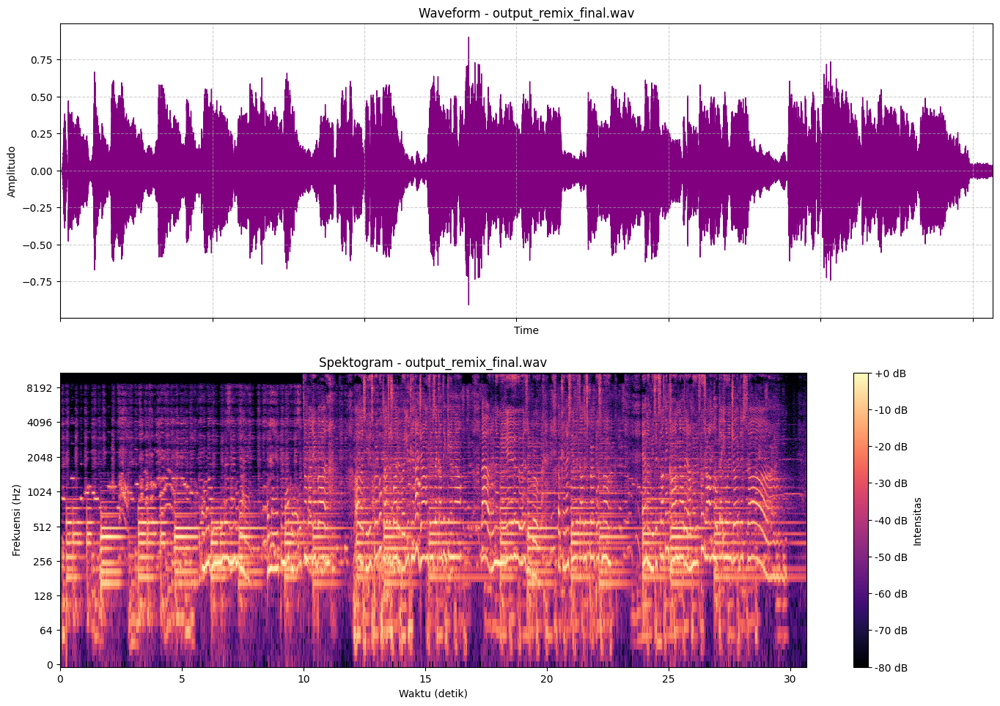

In [19]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

# --- NAMA FILE YANG AKAN DIVISUALISASIKAN ---
NAMA_FILE_REMIX = 'output_remix_final.wav'

def visualize_audio(file_path):
    """
    Fungsi utama untuk memuat file audio dan menampilkan
    waveform serta spektogramnya.
    """
    print(f"Memuat dan memproses file: {file_path}...")
    
    try:
        # 1. Memuat file audio menggunakan Librosa
        # y = data audio (amplitudo), sr = sample rate
        y, sr = librosa.load(file_path)
    except FileNotFoundError:
        print(f"\nERROR: File '{file_path}' tidak ditemukan.")
        print("Pastikan file tersebut berada di folder yang sama dengan skrip Python ini.")
        return # Hentikan eksekusi jika file tidak ada
        
    # 2. Membuat 'kanvas' untuk menampung dua plot (atas dan bawah)
    fig, axs = plt.subplots(2, 1, figsize=(14, 10), sharex=True)
    
    # --- Plot 1: Waveform ---
    print("-> Membuat plot waveform...")
    librosa.display.waveshow(y, sr=sr, ax=axs[0], color='purple')
    axs[0].set_title(f'Waveform - {NAMA_FILE_REMIX}')
    axs[0].set_ylabel('Amplitudo')
    axs[0].grid(True, linestyle='--', alpha=0.6)
    
    # --- Plot 2: Spektogram ---
    print("-> Membuat plot spektogram...")
    # Hitung STFT untuk analisis frekuensi
    D = librosa.stft(y)
    # Konversi amplitudo ke skala Desibel (dB) agar lebih mudah dilihat
    DB = librosa.amplitude_to_db(np.abs(D), ref=np.max)
    
    # Tampilkan spektogram pada plot kedua
    img = librosa.display.specshow(DB, sr=sr, x_axis='time', y_axis='log', ax=axs[1], cmap='magma')
    axs[1].set_title(f'Spektogram - {NAMA_FILE_REMIX}')
    axs[1].set_xlabel('Waktu (detik)')
    axs[1].set_ylabel('Frekuensi (Hz)')
    
    # Tambahkan bar warna sebagai legenda untuk intensitas
    fig.colorbar(img, ax=axs[1], format='%+2.0f dB', label='Intensitas')
    
    # 3. Merapikan dan Menampilkan Hasil
    plt.tight_layout(pad=2.0)
    print("Menampilkan visualisasi...")
    plt.show()

# --- Panggil fungsi utama untuk memulai proses ---
visualize_audio(NAMA_FILE_REMIX)



 • Jelaskan proses dan parameter yang digunakan.

Proses remix melibatkan beberapa tahap pemrosesan audio dengan parameter spesifik:
Time Stretching: Menyamakan tempo kedua lagu menggunakan librosa.effects.time_stretch dengan stretch_ratio = target_tempo/original_tempo untuk memperlambat lagu kedua agar sesuai dengan tempo lagu pertama
Pitch Shifting: Menyelaraskan kunci menggunakan librosa.effects.pitch_shift dengan parameter n_steps sesuai selisih kunci antara kedua lagu
Penggabungan: Menggunakan metode overlay dari pydub dengan normalisasi volume otomatis
Filter Kreatif: Menerapkan low-pass filter (cutoff 800 Hz) pada 10 detik intro menggunakan scipy.signal.butter orde 5

 • Tampilkan waveform dan spektrogram sesudah remix.

Hasil remix divisualisasikan dalam dua representasi:
Waveform menunjukkan amplitudo gabungan kedua lagu yang sudah diselaraskan temponya, dengan envelope yang lebih kompleks akibat interaksi kedua sinyal
Spektogram memperlihatkan distribusi energi frekuensi yang kaya, dengan jelas menampilkan efek filter low-pass di bagian intro dan perpaduan karakteristik spektral kedua lagu

 • Jelaskan hasil remix yang telah dilakukan.
 
 Remix menghasilkan perubahan signifikan pada kedua lagu:
Sinkronisasi tempo berhasil menyatukan groove kedua lagu tanpa mengganggu struktur musikal masing-masing
Penyesuaian kunci mencegah disonansi harmonik saat kedua lagu digabungkan
Filter low-pass pada intro memberikan efek transisi yang halus
Overlay menghasilkan tekstur yang lebih kompleks namun tetap seimbang berkat normalisasi volume
Karakteristik unik masing-masing lagu (nuansa sedih vs ceria) tetap terasa meski sudah digabungkan, menciptakan kontras yang menarik dalam satu komposisi
Hasil akhir mendemonstrasikan bagaimana dua lagu dengan karakter berbeda dapat dipadukan menjadi satu karya baru yang kohesif melalui serangkaian pemrosesan audio digital yang tepat.

## Aturan Umum Pengerjaan

- **Mandiri & Bantuan AI:** Tugas dikerjakan secara mandiri. [cite_start]Bantuan AI seperti ChatGPT diperbolehkan, namun wajib menyertakan bukti percakapan. [cite: 80, 81]
- [cite_start]**Plagiarisme:** Source code antar mahasiswa harus unik untuk menghindari plagiarisme. [cite: 82] [cite_start]Sanksi akan diberlakukan jika terbukti melakukan plagiarisme. [cite: 87]
- [cite_start]**Bantuan Teman:** Jika mendapat bantuan dari teman, cantumkan nama dan NIM teman tersebut di bagian Credit. [cite: 83]

*(Jika menggunakan AI, sertakan bukti percakapan di bawah ini)*

---

## Credit dan Referensi

[Link Gemini](https://gemini.google.com/share/30d76e50b2a1)